Любая задача машинного обучения начинается с данных — будь то список адресов электронной почты, постов или твитов. Распространенными источниками текстовой информации являются:

Отзывы о товарах (Amazon, Yelp и различные магазины приложений).
Контент, созданный пользователями (твиты, посты в Facebook, вопросы на StackOverflow).
Диагностическая информация (запросы пользователей, тикеты в поддержку, логи чатов).

# Шаг 1

### Метки (Labels)

Наши данные имеют метки, так что мы знаем, к каким категориям принадлежат твиты. Как подчеркивает Ричард Сочер, обычно быстрее, проще и дешевле найти и разметить достаточно данных, на которых будет обучаться модель — вместо того, чтобы пытаться оптимизировать сложный метод обучения без учителя.

**Rather than spending a month figuring out an unsupervised machine learning problem, just label some data for a week and train a classifier. — Richard (@RichardSocher) March 10, 2017**

Вместо того, чтобы тратить месяц на формулирование задачи машинного обучения без учителя, просто потратьте неделю на то, чтобы разметить данные, и обучите классификатор.


In [ ]:
!pip install sklearn
!pip install  keras
!pip install  nltk
!pip install  pandas
!pip install  numpy
!pip install  re
!pip install  codecs

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
ERROR: Could not find a version that satisfies the requirement re (from versions: none)
ERROR: No matching distribution found for re
ERROR: Could not find a version that satisfies the requirement codecs (from versions: none)
ERROR: No matching distribution found for codecs


In [ ]:
import sklearn
import keras
import nltk
import pandas as pd
import numpy as np
import re
import codecs

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Шаг 2.  Sanitizing input  Очистите ваши данные

Правило номер один: «Ваша модель сможет стать лишь настолько хороша,
насколько хороши ваши данные»

Одним из ключевых навыков профессионального Data Scientist является знание о том, что должно быть следующим шагом — работа над моделью или над данными. Как показывает практика, сначала лучше взглянуть на сами данные, а только потом произвести их очистку.
Чистый датасет позволит модели выучить значимые признаки и не переобучиться на нерелевантном шуме.

Далее следует чеклист, который используется при очистке наших данных (подробности можно посмотреть в коде).

1. Удалить все нерелевантные символы (например, любые символы, не относящиеся к цифро-буквенным).
1. Токенизировать текст, разделив его на индивидуальные слова.
1. Удалить нерелевантные слова — например, упоминания в Twitter или URL-ы.
1. Перевести все символы в нижний регистр для того, чтобы слова «привет», «Привет» и «ПРИВЕТ» считались одним и тем же словом.
1. Рассмотрите возможность совмещения слов, написанных с ошибками, или имеющих альтернативное написание (например, «круто»/«круть»/ «круууто»)
1. Рассмотрите возможность проведения лемматизации, т. е. сведения различных форм одного слова к словарной форме (например, «машина» вместо «машиной», «на машине», «машинах» и пр.)

После того, как мы пройдемся по этим шагам и выполним проверку на дополнительные ошибки, мы можем начинать использовать чистые, помеченные данные для обучения моделей.


### Проверка данных


In [ ]:
tweets = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Технологии МО/Tweets.csv', encoding='utf-8')
tweets.head()

,textID,text,selected_text,sentiment
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative
2,088c60f138,my boss is bullying me...,bullying me,negative
3,9642c003ef,what interview! leave me alone,leave me alone,negative
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative


In [ ]:
tweets.drop(columns=['textID', 'selected_text'], inplace=True)
tweets

,text,sentiment
0,"I`d have responded, if I were going",neutral
1,Sooo SAD I will miss you here in San Diego!!!,negative
2,my boss is bullying me...,negative
3,what interview! leave me alone,negative
4,"Sons of ****, why couldn`t they put them on t...",negative
...,...,...
27476,wish we could come see u on Denver husband l...,negative
27477,I`ve wondered about rake to. The client has ...,negative
27478,Yay good for both of you. Enjoy the break - y...,positive
27479,But it was worth it ****.,positive


In [ ]:
tweets.describe()

,text,sentiment
count,27480,27481
unique,27480,3
top,"I`d have responded, if I were going",neutral
freq,1,11118


In [ ]:
tweets.isnull().sum()

,0
text,1
sentiment,0


In [ ]:
tweets.dropna(inplace=True)

In [ ]:
tweets.duplicated().sum()

0

In [ ]:
sentiment_map = {'neutral': 0, 'negative': 1, 'positive': 2}
tweets['label'] = tweets['sentiment'].map(sentiment_map)

Давайте воспользуемся регулярными выражениями, чтобы очистить данные и сохранить их на диск для будущего использования.

In [ ]:
def standardize_text(df, text_field):
    df[text_field] = df[text_field].str.replace(r"http\S+", "")
    df[text_field] = df[text_field].str.replace(r"http", "")
    df[text_field] = df[text_field].str.replace(r"@\S+", "")
    df[text_field] = df[text_field].str.replace(r"[^A-Za-z0-9(),!?@\'\`\"\_\n]", " ")
    df[text_field] = df[text_field].str.replace(r"@", "at")
    df[text_field] = df[text_field].str.lower()
    return df

tweets = standardize_text(tweets, "text")

tweets.to_csv("clean_data.csv")
tweets.head()

,text,sentiment,label
0,"i`d have responded, if i were going",neutral,0
1,sooo sad i will miss you here in san diego!!!,negative,1
2,my boss is bullying me...,negative,1
3,what interview! leave me alone,negative,1
4,"sons of ****, why couldn`t they put them on t...",negative,1


In [ ]:
clean_tweets = pd.read_csv("clean_data.csv")
clean_tweets.head()

,Unnamed: 0,text,sentiment,label
0,0,"i`d have responded, if i were going",neutral,0
1,1,sooo sad i will miss you here in san diego!!!,negative,1
2,2,my boss is bullying me...,negative,1
3,3,what interview! leave me alone,negative,1
4,4,"sons of ****, why couldn`t they put them on t...",negative,1


In [ ]:
clean_tweets.drop(columns=['Unnamed: 0'], inplace=True)

### Анализ данных

Посмотрим на баланс данных

In [ ]:
clean_tweets.groupby("label").count()

,text,sentiment
label,,
0,11117,11117
1,7781,7781
2,8582,8582


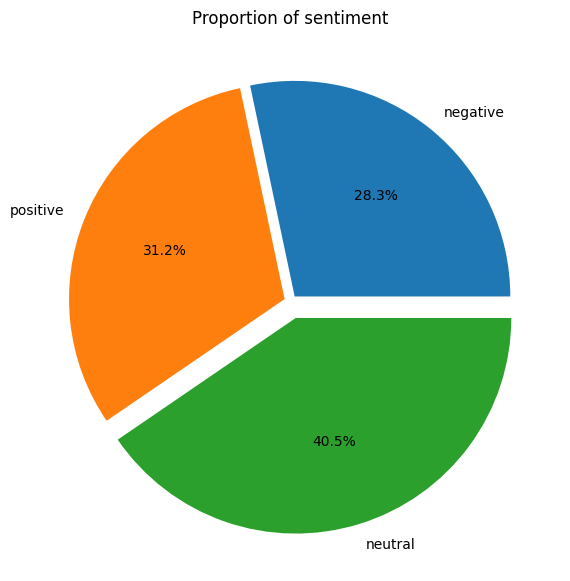

In [ ]:
import matplotlib.pyplot as plt


x = clean_tweets.sentiment.value_counts().sort_values()

plt.figure(figsize=(7, 7))
ax = plt.pie(x = x, labels=x.index, autopct = '%1.1f%%', explode = [0.03, 0.03, 0.08])
plt.title('Proportion of sentiment')

plt.show()

Данные выглядят вполне сбалансированными

Нарисуем карту слов.

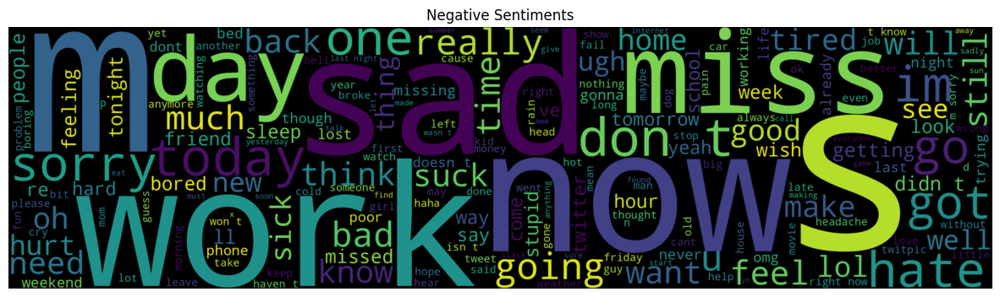

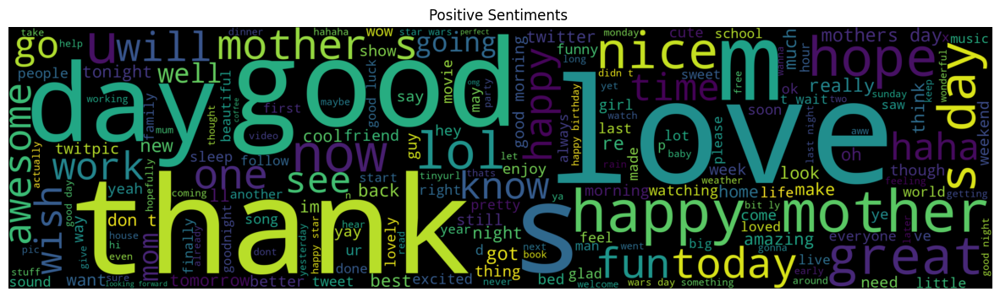

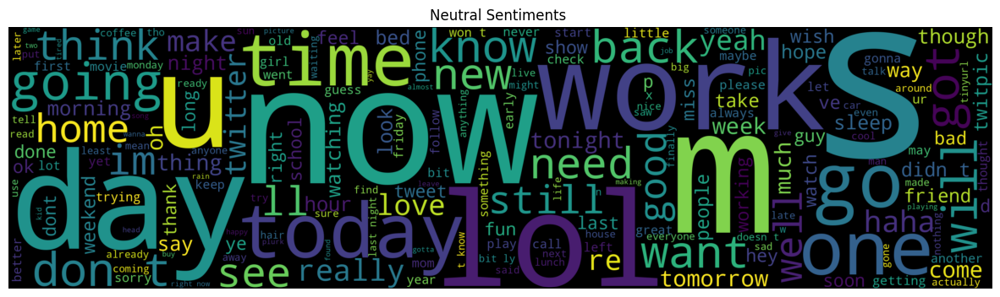

In [ ]:
from wordcloud import WordCloud, STOPWORDS

negative = clean_tweets[clean_tweets['sentiment'] == 'negative']
positive = clean_tweets[clean_tweets['sentiment'] == 'positive']
neutral = clean_tweets[clean_tweets['sentiment'] == 'neutral']

def generate_wordcloud(data, title):
    words = ' '.join(data['text'])
    print(words)
    wordcloud = WordCloud(stopwords=STOPWORDS,background_color='black',
                          width=3000, height=800).generate(words)
    plt.figure(figsize=(15, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

generate_wordcloud(negative, 'Negative Sentiments')
generate_wordcloud(positive, 'Positive Sentiments ')
generate_wordcloud(neutral, 'Neutral Sentiments ')

# Шаг 3.

### Наши данные чисты, теперь их нужно подготовить

Теперь, когда наши входные данные стали более разумными, давайте преобразуем их так, чтобы наша модель могла их понять. Из этого следует:
- Токенизация предложений в список отдельных слов
- Создание тестового сплита трейна
- Еще немного проверяем наши данные, чтобы подтвердить результаты.

In [ ]:
from nltk.tokenize import RegexpTokenizer

tokenizer = RegexpTokenizer(r'\w+')

clean_tweets["tokens"] = clean_tweets["text"].apply(tokenizer.tokenize)
clean_tweets.head()

,text,sentiment,label,tokens
0,"i`d have responded, if i were going",neutral,0,"[i, d, have, responded, if, i, were, going]"
1,sooo sad i will miss you here in san diego!!!,negative,1,"[sooo, sad, i, will, miss, you, here, in, san,..."
2,my boss is bullying me...,negative,1,"[my, boss, is, bullying, me]"
3,what interview! leave me alone,negative,1,"[what, interview, leave, me, alone]"
4,"sons of ****, why couldn`t they put them on t...",negative,1,"[sons, of, why, couldn, t, they, put, them, on..."


### Анализируем датасет дальше

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from  keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

all_words = [word for tokens in clean_tweets["tokens"] for word in tokens]
sentence_lengths = [len(tokens) for tokens in clean_tweets["tokens"]]
VOCAB = sorted(list(set(all_words)))
print("%s words total, with a vocabulary size of %s" % (len(all_words), len(VOCAB)))
print("Max sentence length is %s" % max(sentence_lengths))

367556 words total, with a vocabulary size of 26477
Max sentence length is 39


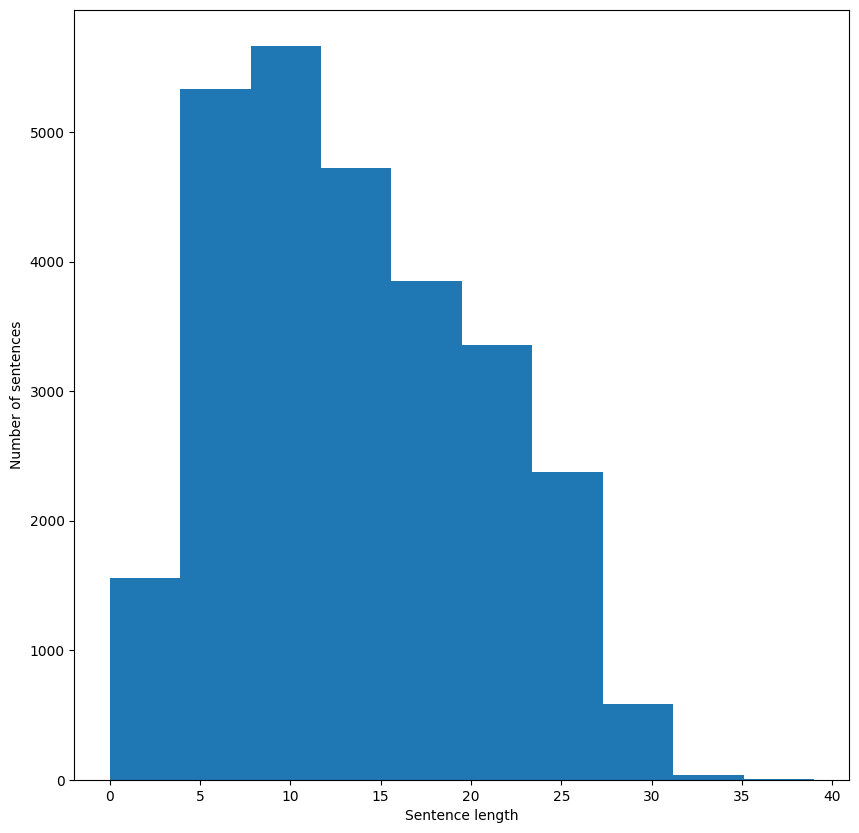

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 10))
plt.xlabel('Sentence length')
plt.ylabel('Number of sentences')
plt.hist(sentence_lengths)
plt.show()

## К машинному обучению
Теперь, когда наши данные очищены и подготовлены, давайте займемся машинным обучением.

## Enter embeddings
 Машинное обучение для изображений может использовать необработанные пиксели в качестве входных данных. Алгоритмы обнаружения мошенничества могут использовать характеристики клиента/транзакций. Что может использовать НЛП?

Естественным способом представления текста для компьютеров является кодирование каждого символа по отдельности, что кажется совершенно неадекватным для представления и понимания языка. Наша цель — сначала создать полезное вложение для каждого предложения (или твита) в нашем наборе данных, а затем использовать эти вложения для точного прогнозирования соответствующей категории.

Самый простой подход, с которого мы можем начать, — это использовать модель мешка слов и применить к ней логистическую регрессию.
**Мешок слов** - мы можем построить словарь всех уникальных слов в нашем датасете, и ассоциировать уникальный индекс каждому слову в словаре. Каждое предложение тогда можно будет отобразить списком, длина которого равна числу уникальных слов в нашем словаре, а в каждом индексе в этом списке будет хранится, сколько раз данное слово встречается в предложении.
То есть мешок слов просто связывает индекс с каждым словом в нашем словаре и встраивает каждое предложение в виде списка нулей, с 1 в каждом индексе, соответствующем слову, присутствующему в предложении.

## Bag of Words Counts

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

def cv(data):
    count_vectorizer = CountVectorizer()
    emb = count_vectorizer.fit_transform(data)
    return emb, count_vectorizer



list_corpus = clean_tweets["text"].tolist()
list_labels = clean_tweets["label"].tolist()

X_train, X_test, y_train, y_test = train_test_split(list_corpus, list_labels, test_size=0.2,
                                                                                random_state=40)

X_train_counts, count_vectorizer = cv(X_train)
X_test_counts = count_vectorizer.transform(X_test)

### Визуализируем векторные представления


Для того, чтобы выяснить, захватывают ли наши векторные представления (embeddings), релевантную нашей задаче информацию (например, имеют ли твиты отношение к катастрофам или нет), стоит попробовать визуализировать их и посмотреть, насколько хорошо разделены эти классы. Поскольку словари обычно являются очень большими и визуализация данных на 20 000 измерений невозможна, подходы вроде метода главных компонент (PCA) помогают спроецировать данные на два измерения.

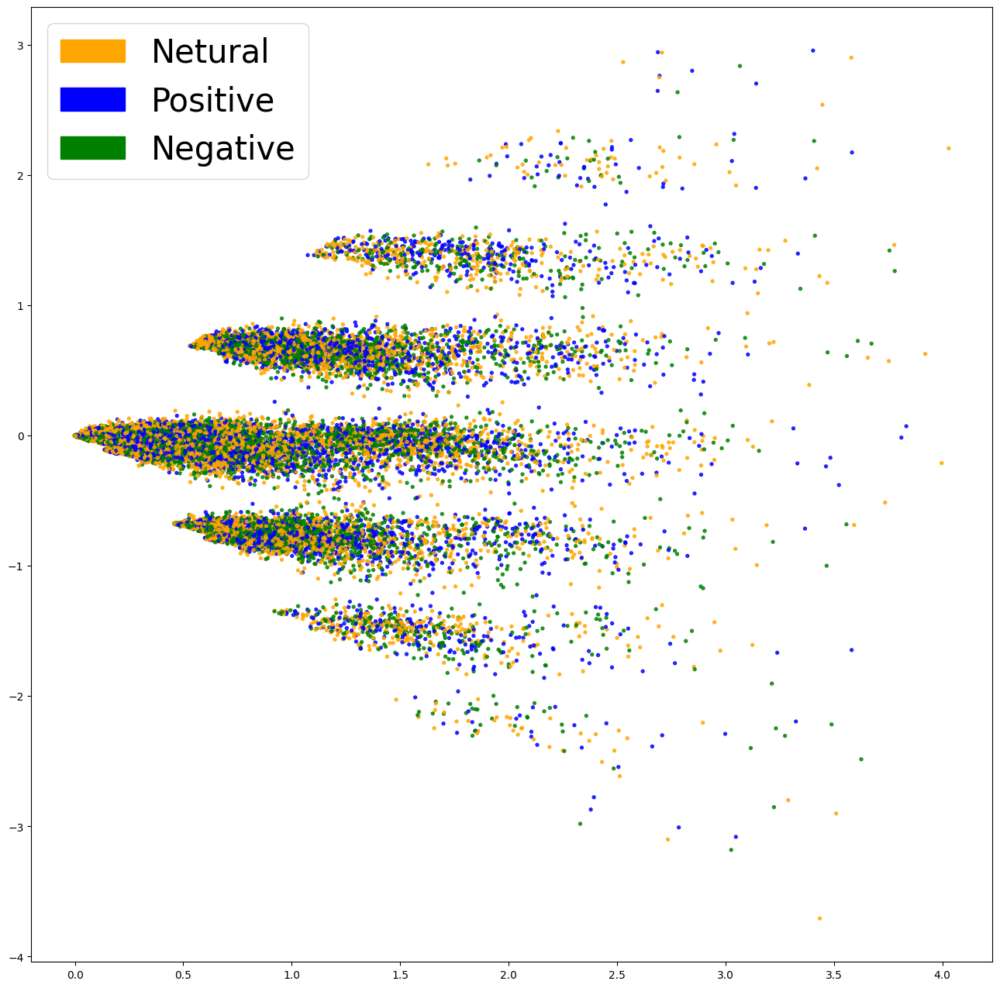

In [ ]:
from sklearn.decomposition import PCA, TruncatedSVD
import matplotlib
import matplotlib.patches as mpatches


def plot_LSA(test_data, test_labels, savepath="PCA_demo.csv", plot=True):
        lsa = TruncatedSVD(n_components=2)
        lsa.fit(test_data)
        lsa_scores = lsa.transform(test_data)
        color_mapper = {label:idx for idx,label in enumerate(set(test_labels))}
        color_column = [color_mapper[label] for label in test_labels]
        colors = ['orange','blue','green']
        if plot:
            plt.scatter(lsa_scores[:,0], lsa_scores[:,1], s=8, alpha=.8, c=test_labels, cmap=matplotlib.colors.ListedColormap(colors))
            red_patch = mpatches.Patch(color='orange', label='Neutral')
            blue_patch = mpatches.Patch(color='blue', label='Positive')
            green_patch = mpatches.Patch(color='green', label='Negative')

            plt.legend(handles=[red_patch, blue_patch, green_patch], prop={'size': 30})


fig = plt.figure(figsize=(16, 16))
plot_LSA(X_train_counts, y_train)
plt.show()

Что-то не очень....

# Шаг 4. Классификация

### Fitting a classifier

Когда вы в первый раз принимаетесь за задачу, общепринятой практикой является начать с самого простого способа или инструмента, который может решить эту задачу. Когда дело касается классификации данных, наиболее распространенным способом является логистическая регрессия из-за своей универсальности и легкости толкования. Ее очень просто обучить, и ее результаты можно интерпретировать, поскольку вы можете с легкостью извлечь все самые важные коэффициенты из модели.



In [ ]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(C=30.0, class_weight='balanced', solver='newton-cg',
                         multi_class='multinomial', n_jobs=-1, random_state=40)
clf.fit(X_train_counts, y_train)

y_predicted_counts = clf.predict(X_test_counts)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


### Метрики!


In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, r2_score, classification_report

def get_metrics(y_test, y_predicted):
    # true positives / (true positives+false positives)
    precision = precision_score(y_test, y_predicted, pos_label=None,
                                    average='weighted')
    # true positives / (true positives + false negatives)
    recall = recall_score(y_test, y_predicted, pos_label=None,
                              average='weighted')

    # harmonic mean of precision and recall
    f1 = f1_score(y_test, y_predicted, pos_label=None, average='weighted')

    r2 = r2_score(y_test, y_predicted)
    # true positives + true negatives/ total
    accuracy = accuracy_score(y_test, y_predicted)
    return accuracy, precision, recall, f1, r2

accuracy, precision, recall, f1, r2 = get_metrics(y_test, y_predicted_counts)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f, r2 = %.3f" % (accuracy, precision, recall, f1,r2))

accuracy = 0.648, precision = 0.648, recall = 0.648, f1 = 0.648, r2 = -0.107


# Шаг 5.

### Инспектирование
Матрица ошибок

Первый шаг — это понять, какие типы ошибок совершает наша модель, и с какими видами ошибок нам в дальнейшем хотелось бы встречаться реже всего. В случае нашего примера, ложно-положительные результаты классифицируют нерелевантный твит в качестве катастрофы, ложно-отрицательные — классифицируют катастрофу как нерелевантный твит. Если нашим приоритетом является реакция на каждое потенциальное событие, то мы захотим снизить наши ложно-отрицательные срабатывания. Однако, если мы ограничены в ресурсах, то мы можем приоритезировать более низкую частоту ложно-отрицательных срабатываний для уменьшения вероятности ложной тревоги. Хорошим способом визуализации данной информации является использование матрицы ошибок, которая сравнивает предсказания, сделанные нашей моделью, с реальными метками. В идеале, данная матрица будет представлять собой диагональную линию, идущую из левого верхнего до нижнего правого угла (это будет означать, что наши предсказания идеально совпали с правдой).

In [ ]:
import numpy as np
import itertools
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.winter):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=30)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, fontsize=20)
    plt.yticks(tick_marks, classes, fontsize=20)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center",
                 color="white" if cm[i, j] < thresh else "black", fontsize=40)

    plt.tight_layout()
    plt.ylabel('True label', fontsize=30)
    plt.xlabel('Predicted label', fontsize=30)

    return plt

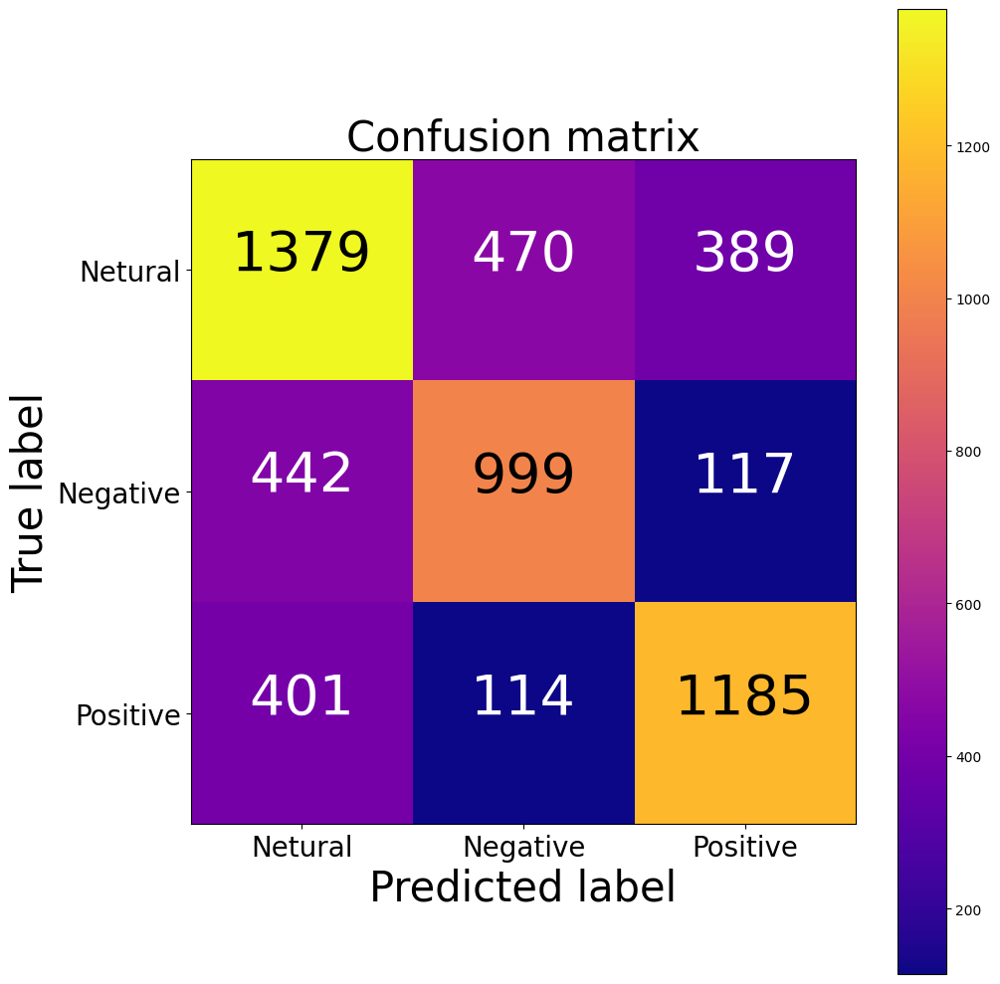

[[1379  470  389]
 [ 442  999  117]
 [ 401  114 1185]]


In [ ]:
cm = confusion_matrix(y_test, y_predicted_counts)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm, classes=['Neutral','Negative','Positive'], normalize=False, title='Confusion matrix', cmap="plasma")
plt.show()
print(cm)

Наш классификатор создает больше ложно-отрицательных, чем ложно-положительных результатов (пропорционально). Другими словами, самая частая ошибка нашей модели состоит в неточной классификации катастроф как нерелевантных. Если ложно-положительные отражают высокую стоимость для правоохранительных органов, то это может стать хорошим вариантом для нашего классификатора.

### Инспектируем дальше

Чтобы произвести валидацию нашей модели и интерпретировать ее предсказания, важно посмотреть на то, какие слова она использует для принятия решений. Если наши данные смещены, наш классификатор произведет точные предсказания на выборочных данных, но модель не сможет достаточно хорошо обобщить их в реальном мире. На диаграмме ниже показаны наиболее значимые слова для классов катастроф и нерелевантных твитов. Составление диаграмм, отражающих значимость слов, не составляет трудностей в случае использования «мешка слов» и логистической регрессии, поскольку мы просто извлекаем и ранжируем коэффициенты, которые модель использует для своих предсказаний.

Посмотрим, на каких признаках наш классификатор делает предсказание.

In [ ]:
def get_most_important_features(vectorizer, model, n=5):
    index_to_word = {v:k for k,v in vectorizer.vocabulary_.items()}

    # loop for each class
    classes ={}
    for class_index in range(model.coef_.shape[0]):
        word_importances = [(el, index_to_word[i]) for i,el in enumerate(model.coef_[class_index])]
        sorted_coeff = sorted(word_importances, key = lambda x : x[0], reverse=True)
        tops = sorted(sorted_coeff[:n], key = lambda x : x[0])
        bottom = sorted_coeff[-n:]
        classes[class_index] = {
            'tops':tops,
            'bottom':bottom
        }
    return classes

importance = get_most_important_features(count_vectorizer, clf, 10)
importance

{0: {'tops': [(4.850100427482698, 'indoors'),
   (5.093151660747679, 'keeper'),
   (5.142202562368547, 'eeeeeeek'),
   (5.163275327944402, 'sleepiness'),
   (5.2030139032044564, 'ditto'),
   (5.412227298627307, 'nancy'),
   (5.70710764823878, 'nothin'),
   (5.731955699944297, 'starwarsday'),
   (5.895519021234954, 'trick'),
   (7.801658840781875, 'chu')],
  'bottom': [(-4.443950897676674, 'nuts'),
   (-4.479560207806074, '67ykl'),
   (-4.481760241996352, 'convenient'),
   (-4.520326376472896, 'awaiting'),
   (-4.528436833334642, 'inviting'),
   (-4.578808049627687, 'denmark'),
   (-4.6300176965460285, 'witcha'),
   (-4.797509432596958, 'appropriate'),
   (-4.945217828097044, 'bitch'),
   (-5.158354887184774, 'briliant')]},
 1: {'tops': [(6.009875566654677, 'stressed'),
   (6.0125091478557895, 'cookoutofthecentury'),
   (6.469199073488407, 'orlando'),
   (6.605065908050334, 'sucks'),
   (6.757535109076928, 'mommas'),
   (6.954266228998603, 'gourmetcook'),
   (7.16014813064844, 'struggli

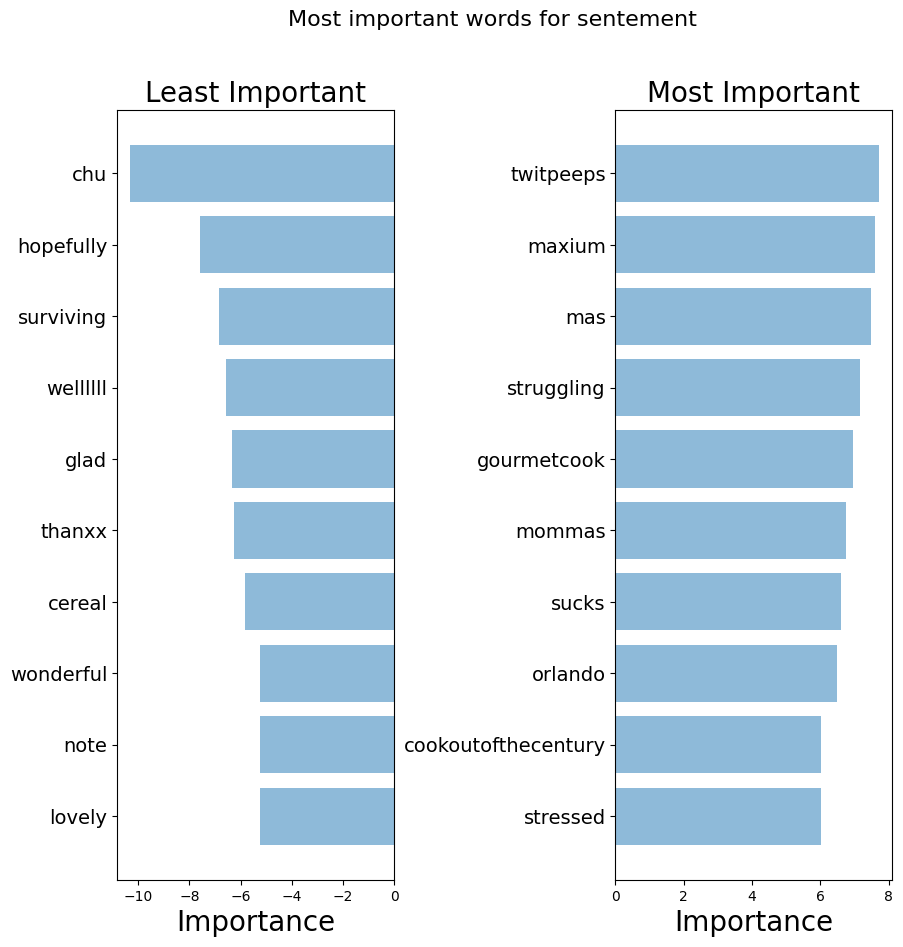

In [ ]:
def plot_important_words(top_scores, top_words, bottom_scores, bottom_words, name):
    y_pos = np.arange(len(top_words))
    top_pairs = [(a,b) for a,b in zip(top_words, top_scores)]
    top_pairs = sorted(top_pairs, key=lambda x: x[1])

    bottom_pairs = [(a,b) for a,b in zip(bottom_words, bottom_scores)]
    bottom_pairs = sorted(bottom_pairs, key=lambda x: x[1], reverse=True)

    top_words = [a[0] for a in top_pairs]
    top_scores = [a[1] for a in top_pairs]

    bottom_words = [a[0] for a in bottom_pairs]
    bottom_scores = [a[1] for a in bottom_pairs]

    fig = plt.figure(figsize=(10, 10))

    plt.subplot(121)
    plt.barh(y_pos,bottom_scores, align='center', alpha=0.5)
    plt.title('Least Important', fontsize=20)
    plt.yticks(y_pos, bottom_words, fontsize=14)
    plt.suptitle('Key words', fontsize=16)
    plt.xlabel('Importance', fontsize=20)

    plt.subplot(122)
    plt.barh(y_pos,top_scores, align='center', alpha=0.5)
    plt.title('Most Important', fontsize=20)
    plt.yticks(y_pos, top_words, fontsize=14)
    plt.suptitle(name, fontsize=16)
    plt.xlabel('Importance', fontsize=20)

    plt.subplots_adjust(wspace=0.8)
    plt.show()

top_scores = [a[0] for a in importance[1]['tops']]
top_words = [a[1] for a in importance[1]['tops']]
bottom_scores = [a[0] for a in importance[1]['bottom']]
bottom_words = [a[1] for a in importance[1]['bottom']]

plot_important_words(top_scores, top_words, bottom_scores, bottom_words, "Most important words for sentement")

# Шаг 6. Учтите структуру словаря

### TFIDF Bag of Words

Чтобы помочь нашей модели сфокусироваться на значимых словах, мы можем использовать скоринг TF-IDF (Term Frequency, Inverse Document Frequency) поверх нашей модели «мешка слов». TF-IDF взвешивает на основании того, насколько они редки в нашем датасете, понижая в приоритете слова, которые встречаются слишком часто и просто добавляют шум. Ниже приводится проекция метода главных компонент, позволяющая оценить наше новое представление.

In [ ]:
def tfidf(data):
    tfidf_vectorizer = TfidfVectorizer()

    train = tfidf_vectorizer.fit_transform(data)

    return train, tfidf_vectorizer

X_train_tfidf, tfidf_vectorizer = tfidf(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

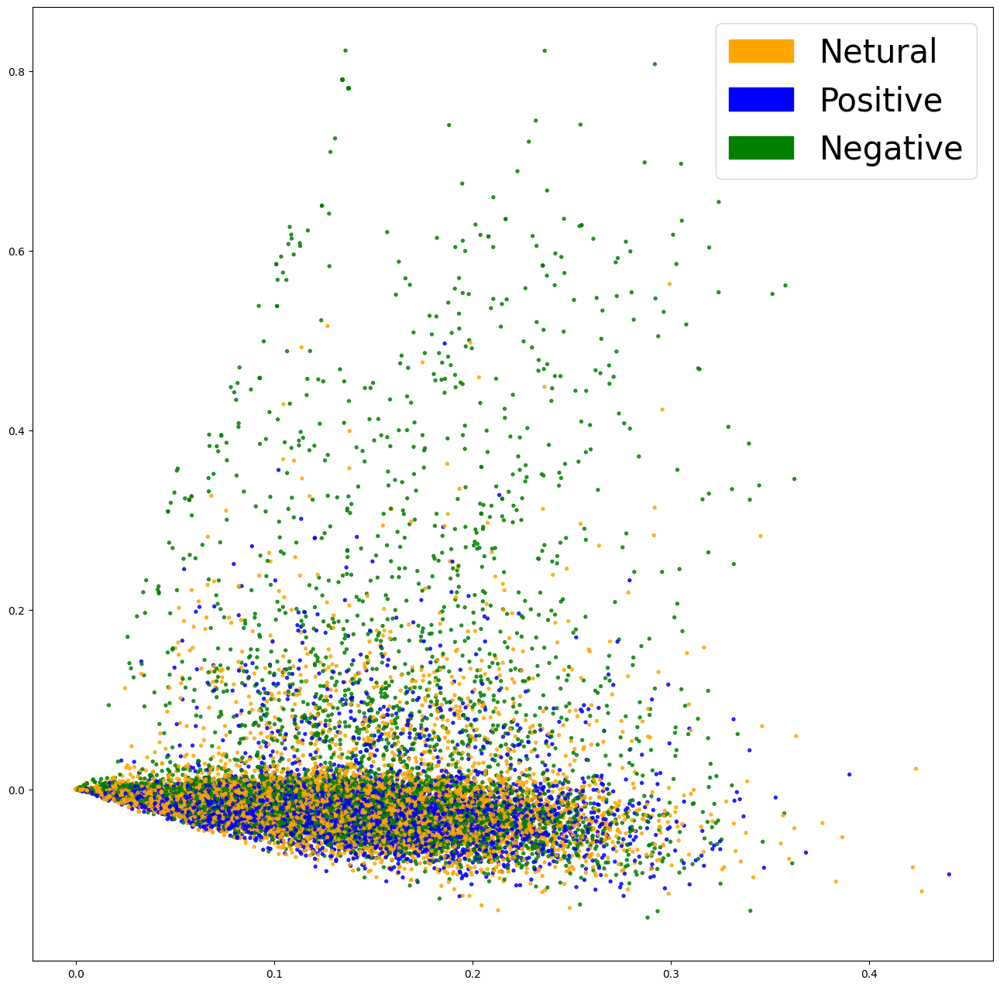

In [ ]:
fig = plt.figure(figsize=(16, 16))
plot_LSA(X_train_tfidf, y_train)
plt.show()

При некоторой фантазии, мы можем наблюдать более четкое разделение между двумя цветами. Это свидетельствует о том, что нашему классификатору должно стать проще разделить обе группы.

In [ ]:
clf_tfidf = LogisticRegression(C=30.0, class_weight='balanced', solver='newton-cg',
                         multi_class='multinomial', n_jobs=-1, random_state=40)
clf_tfidf.fit(X_train_tfidf, y_train)

y_predicted_tfidf = clf_tfidf.predict(X_test_tfidf)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf, r2_tfidf = get_metrics(y_test, y_predicted_tfidf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f, r2 = %.3f"  % (accuracy_tfidf, precision_tfidf, recall_tfidf, f1_tfidf, r2_tfidf))


accuracy = 0.658, precision = 0.658, recall = 0.658, f1 = 0.658, r2 = -0.070


Результаты получше

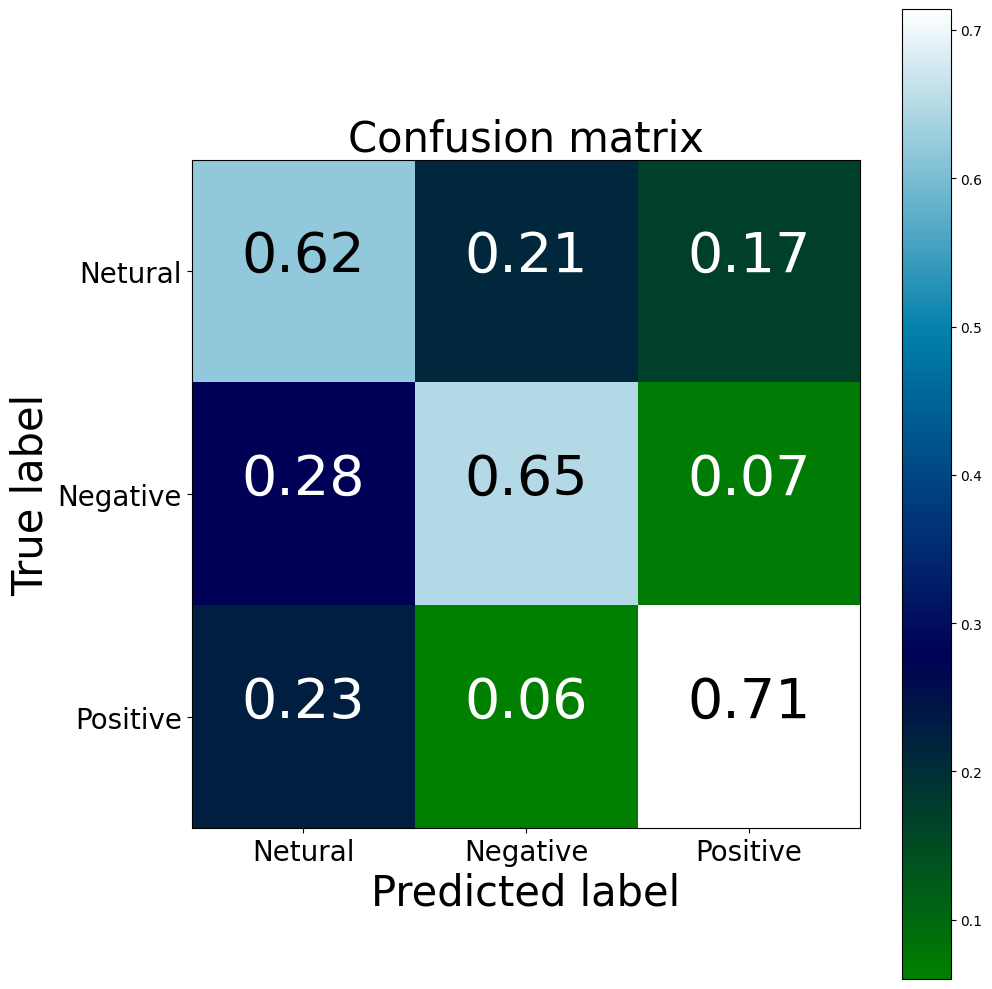

TFIDF confusion matrix
[[1390  473  375]
 [ 437 1012  109]
 [ 384  102 1214]]
BoW confusion matrix
[[1379  470  389]
 [ 442  999  117]
 [ 401  114 1185]]


In [ ]:
cm2 = confusion_matrix(y_test, y_predicted_tfidf)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm2, classes=['Neutral','Negative','Positive'], normalize=True, title='Confusion matrix', cmap="ocean")
plt.show()
print("TFIDF confusion matrix")
print(cm2)
print("BoW confusion matrix")
print(cm)

Сравним две матрицы

### Посмотрим, какие признаки были важны для предсказания


In [ ]:
importance_tfidf = get_most_important_features(tfidf_vectorizer, clf_tfidf, 10)

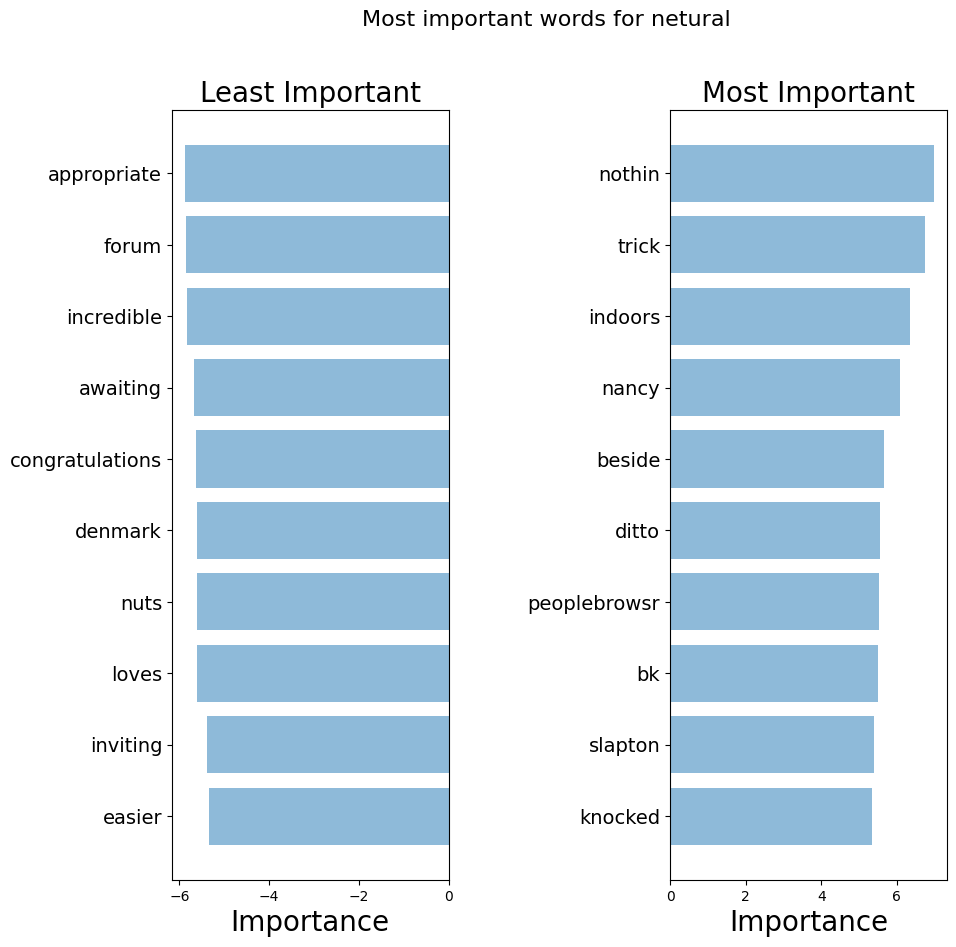

In [ ]:
top_scores = [a[0] for a in importance_tfidf[0]['tops']]
top_words = [a[1] for a in importance_tfidf[0]['tops']]
bottom_scores = [a[0] for a in importance_tfidf[0]['bottom']]
bottom_words = [a[1] for a in importance_tfidf[0]['bottom']]

plot_important_words(top_scores, top_words, bottom_scores, bottom_words, "Most important words for neutral")

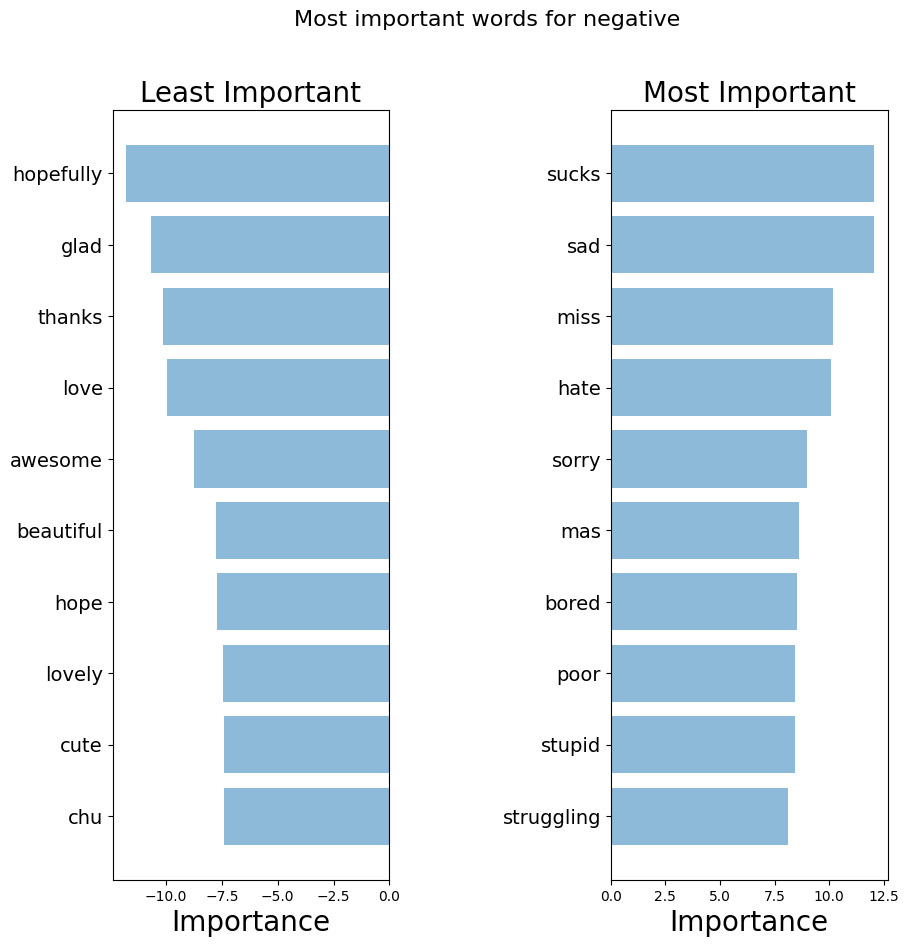

In [ ]:
top_scores = [a[0] for a in importance_tfidf[1]['tops']]
top_words = [a[1] for a in importance_tfidf[1]['tops']]
bottom_scores = [a[0] for a in importance_tfidf[1]['bottom']]
bottom_words = [a[1] for a in importance_tfidf[1]['bottom']]

plot_important_words(top_scores, top_words, bottom_scores, bottom_words, "Most important words for negative")

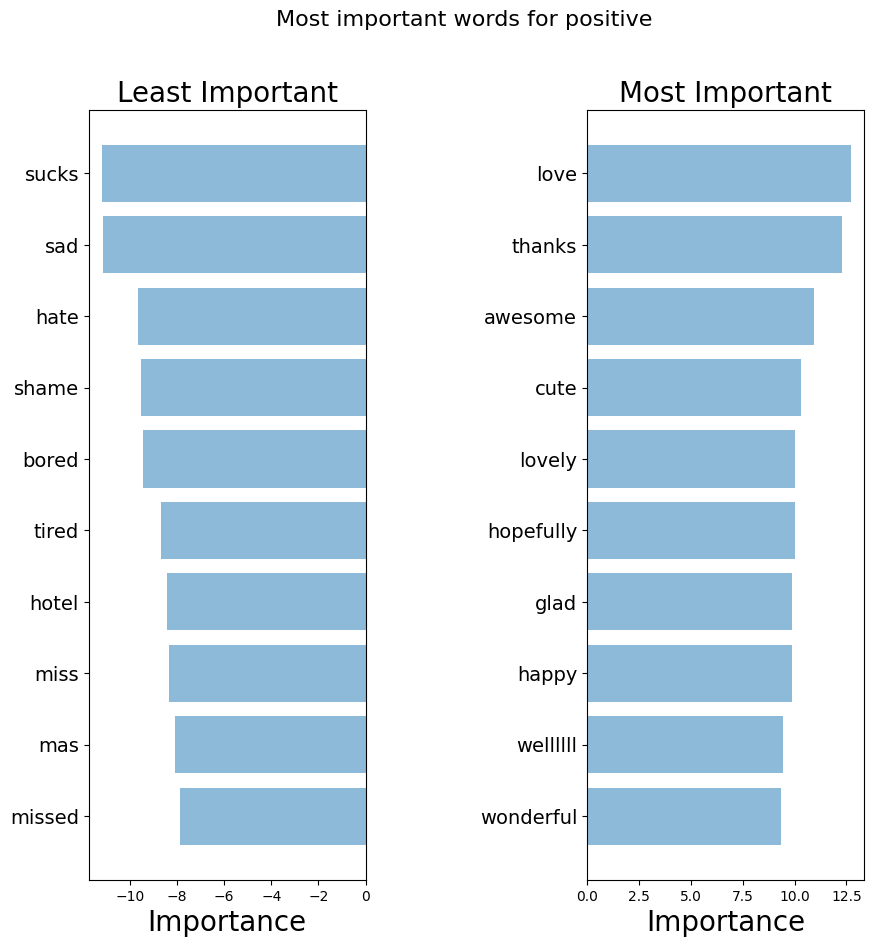

In [ ]:
top_scores = [a[0] for a in importance_tfidf[2]['tops']]
top_words = [a[1] for a in importance_tfidf[2]['tops']]
bottom_scores = [a[0] for a in importance_tfidf[2]['bottom']]
bottom_words = [a[1] for a in importance_tfidf[2]['bottom']]

plot_important_words(top_scores, top_words, bottom_scores, bottom_words, "Most important words for positive")

Выбранные моделью слова действительно выглядят гораздо более релевантными. Несмотря на то, что метрики на нашем тестовом множестве увеличились совсем незначительно, у нас теперь гораздо больше уверенности в использовании модели в реальной системе, которая будет взаимодействовать с клиентами.

# Шаг 7

### Применение семантики

Word2Vec

Наша последняя модель смогла «выхватить» слова, несущие наибольшее значение. Однако, скорее всего, когда мы выпустим ее в продакшн, она столкнется со словами, которые не встречались в обучающей выборке — и не сможет точно классифицировать эти твиты, даже если она видела весьма похожие слова во время обучения.

Чтобы решить данную проблему, нам потребуется захватить семантическое (смысловое) значение слов — это означает, что для нас важно понимать, что слова «хороший» и «позитивный» ближе друг к другу, чем слова «абрикос» и «континент». Мы воспользуемся инструментом Word2Vec, который поможет нам сопоставить значения слов.

Использование результатов предварительного обучения

Word2Vec — это техника для поиска непрерывных отображений для слов. Word2Vec обучается на прочтении огромного количества текста с последующим запоминанием того, какое слово возникает в схожих контекстах. После обучения на достаточном количестве данных, Word2Vec генерирует вектор из 300 измерений для каждого слова в словаре, в котором слова со схожим значением располагаются ближе друг к другу.

Авторы публикации на тему непрерывных векторных представлений слов выложили в открытый доступ модель, которая была предварительно обучена на очень большом объеме информации, и мы можем использовать ее в нашей модели, чтобы внести знания о семантическом значении слов.

Взять можно тут:
python -m gensim.downloader --download word2vec-google-news-300

In [ ]:
!python -m gensim.downloader --download word2vec-google-news-300

2024-11-29 08:02:07,742 : __main__ : INFO : Creating /root/gensim-data
[==================================================] 100.0% 1662.8/1662.8MB downloaded
2024-11-29 08:03:40,750 : __main__ : INFO : word2vec-google-news-300 downloaded
2024-11-29 08:03:40,750 : __main__ : INFO : Data has been installed and data path is /root/gensim-data/word2vec-google-news-300/word2vec-google-news-300.gz


In [ ]:
import gensim

# Load Google's pre-trained Word2Vec model.
word2vec_path = "~/gensim-data/word2vec-google-news-300/word2vec-google-news-300.gz"
word2vec = gensim.models.KeyedVectors.load_word2vec_format(word2vec_path, binary=True)

In [ ]:
def get_average_word2vec(tokens_list, vector, generate_missing=False, k=300):
    if len(tokens_list)<1:
        return np.zeros(k)
    if generate_missing:
        vectorized = [vector[word] if word in vector else np.random.rand(k) for word in tokens_list]
    else:
        vectorized = [vector[word] if word in vector else np.zeros(k) for word in tokens_list]
    length = len(vectorized)
    summed = np.sum(vectorized, axis=0)
    averaged = np.divide(summed, length)
    return averaged

def get_word2vec_embeddings(vectors, clean_questions, generate_missing=False):
    embeddings = clean_questions['tokens'].apply(lambda x: get_average_word2vec(x, vectors,
                                                                                generate_missing=generate_missing))
    return list(embeddings)

In [ ]:
embeddings = get_word2vec_embeddings(word2vec, clean_tweets)
X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec = train_test_split(embeddings, list_labels,
                                                                                        test_size=0.2, random_state=40)

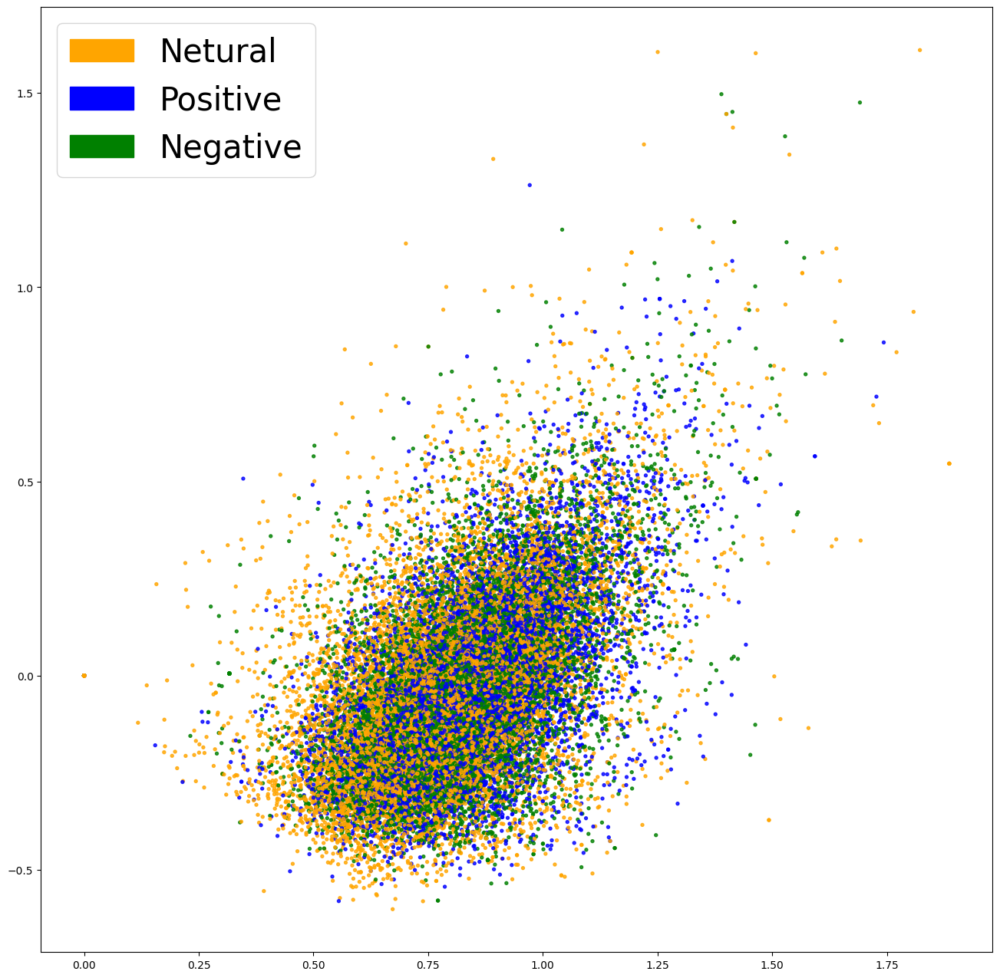

In [ ]:
fig = plt.figure(figsize=(16, 16))
plot_LSA(embeddings, list_labels)
plt.show()

Разделение видно даже без привлечения дополнительной фантазии!

In [ ]:
clf_w2v = LogisticRegression(C=30.0, class_weight='balanced', solver='newton-cg',
                         multi_class='multinomial', random_state=40)
clf_w2v.fit(X_train_word2vec, y_train_word2vec)
y_predicted_word2vec = clf_w2v.predict(X_test_word2vec)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
accuracy_word2vec, precision_word2vec, recall_word2vec, f1_word2vec, r2_word2vec = get_metrics(y_test_word2vec, y_predicted_word2vec)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f, r2 = %.3f" % (accuracy_word2vec, precision_word2vec, recall_word2vec, f1_word2vec, r2_word2vec))

accuracy = 0.665, precision = 0.666, recall = 0.665, f1 = 0.665, r2 = -0.039


Still getting better, let's plot the confusion matrix

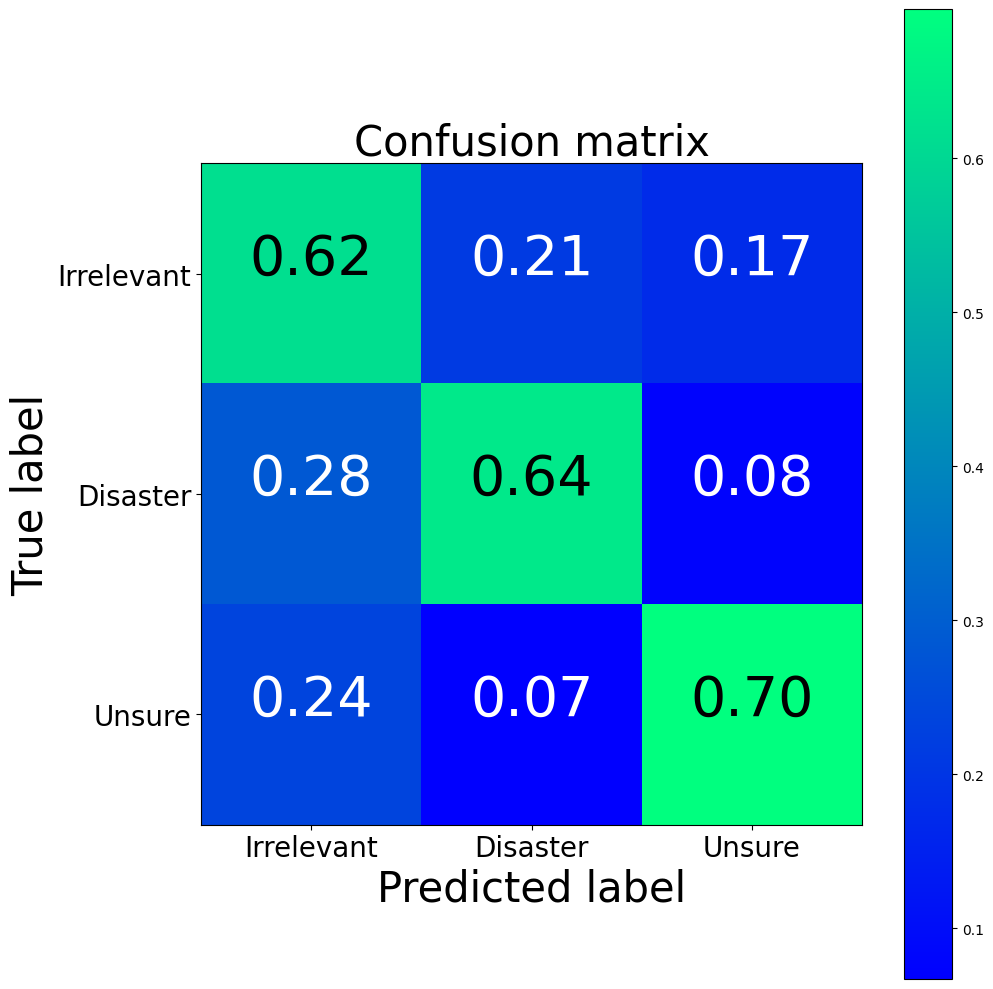

Word2Vec confusion matrix
[[1405  476  357]
 [ 397 1044  117]
 [ 376  116 1208]]
TFIDF confusion matrix
[[1390  473  375]
 [ 437 1012  109]
 [ 384  102 1214]]
BoW confusion matrix
[[1379  470  389]
 [ 442  999  117]
 [ 401  114 1185]]


In [ ]:
cm_w2v = confusion_matrix(y_test_word2vec, y_predicted_word2vec)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm, classes=['Irrelevant','Disaster','Unsure'], normalize=True, title='Confusion matrix')
plt.show()
print("Word2Vec confusion matrix")
print(cm_w2v)
print("TFIDF confusion matrix")
print(cm2)
print("BoW confusion matrix")
print(cm)

Все лучше и лучше!

### Further inspection
Поскольку наши векторные представления более не представлены в виде вектора с одним измерением на слово, как было в предыдущих моделях, теперь тяжелее понять, какие слова наиболее релевантны для нашей классификации. Несмотря на то, что мы по-прежнему обладаем доступом к коэффициентам нашей логистической регрессии, они относятся к 300 измерениям наших вложений, а не к индексам слов.

Для столь небольшого прироста точности, полная потеря возможности объяснить работу модели — это слишком жесткий компромисс. К счастью, при работе с более сложными моделями мы можем использовать интерпретаторы наподобие LIME, которые применяются для того, чтобы получить некоторое представление о том, как работает классификатор.

#### LIME

LIME доступен на Github в виде открытого пакета. Данный интерпретатор, работающий по принципу черного ящика, позволяет пользователям объяснять решения любого классификатора на одном конкретном примере при помощи изменения ввода (в нашем случае — удаления слова из предложения) и наблюдения за тем, как изменяется предсказание.

Давайте взглянем на пару объяснений для предложений из нашего датасета.

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=6a744561987689624afd2e91973c59691e58d92354728f0f330981a6f540f8a3
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from lime import lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer

X_train_data, X_test_data, y_train_data, y_test_data = train_test_split(list_corpus, list_labels, test_size=0.2,
                                                                                random_state=40)
vector_store = word2vec
def word2vec_pipeline(examples):
    global vector_store
    tokenizer = RegexpTokenizer(r'\w+')
    tokenized_list = []
    for example in examples:
        example_tokens = tokenizer.tokenize(example)
        vectorized_example = get_average_word2vec(example_tokens, vector_store, generate_missing=False, k=300)
        tokenized_list.append(vectorized_example)
    return clf_w2v.predict_proba(tokenized_list)

c = make_pipeline(count_vectorizer, clf)

In [ ]:
def explain_one_instance(instance, class_names):
    explainer = LimeTextExplainer(class_names=class_names)
    exp = explainer.explain_instance(instance, word2vec_pipeline, num_features=6)
    return exp

def visualize_one_exp(features, labels, index, class_names = ["neutral","negative", "positive"]):
    exp = explain_one_instance(features[index], class_names = class_names)
    print('Index: %d' % index)
    print('True class: %s' % class_names[labels[index]])
    exp.show_in_notebook(text=True)

In [ ]:
visualize_one_exp(X_test_data, y_test_data, 5)

Index: 5
True class: neutral


In [ ]:
visualize_one_exp(X_test_data, y_test_data, 3)

Index: 3
True class: negative


In [ ]:
visualize_one_exp(X_test_data, y_test_data, 6)

Index: 6
True class: positive


Впрочем, у нас нет достаточного количества времени, чтобы исследовать тысячи примеров из нашего датасета. Вместо этого, давайте запустим LIME на репрезентативной выборке тестовых данных, и посмотрим, какие слова встречаются регулярно и вносят наибольший вклад в конечный результат. Используя данный подход, мы можем получить оценки значимости слов аналогично тому, как мы делали это для предыдущих моделей, и валидировать предсказания нашей модели.

In [ ]:
import random
from collections import defaultdict

random.seed(40)

def get_statistical_explanation(test_set, sample_size, word2vec_pipeline, label_dict):
    sample_sentences = random.sample(test_set, sample_size)
    explainer = LimeTextExplainer()

    labels_to_sentences = defaultdict(list)
    contributors = defaultdict(dict)

    # First, find contributing words to each class
    for sentence in sample_sentences:
        probabilities = word2vec_pipeline([sentence])
        curr_label = probabilities[0].argmax()
        labels_to_sentences[curr_label].append(sentence)
        exp = explainer.explain_instance(sentence, word2vec_pipeline, num_features=6, labels=[curr_label])
        listed_explanation = exp.as_list(label=curr_label)

        for word,contributing_weight in listed_explanation:
            if word in contributors[curr_label]:
                contributors[curr_label][word].append(contributing_weight)
            else:
                contributors[curr_label][word] = [contributing_weight]

    # average each word's contribution to a class, and sort them by impact
    average_contributions = {}
    sorted_contributions = {}
    for label,lexica in contributors.items():
        curr_label = label
        curr_lexica = lexica
        average_contributions[curr_label] = pd.Series(index=curr_lexica.keys())
        for word,scores in curr_lexica.items():
            average_contributions[curr_label].loc[word] = np.sum(np.array(scores))/sample_size
        detractors = average_contributions[curr_label].sort_values()
        supporters = average_contributions[curr_label].sort_values(ascending=False)
        sorted_contributions[label_dict[curr_label]] = {
            'detractors':detractors,
             'supporters': supporters
        }
    return sorted_contributions

label_to_text = {
    0: 'Neutral',
    1: 'Negative',
    2: 'Positive'
}
sorted_contributions = get_statistical_explanation(X_test_data, 100, word2vec_pipeline, label_to_text)

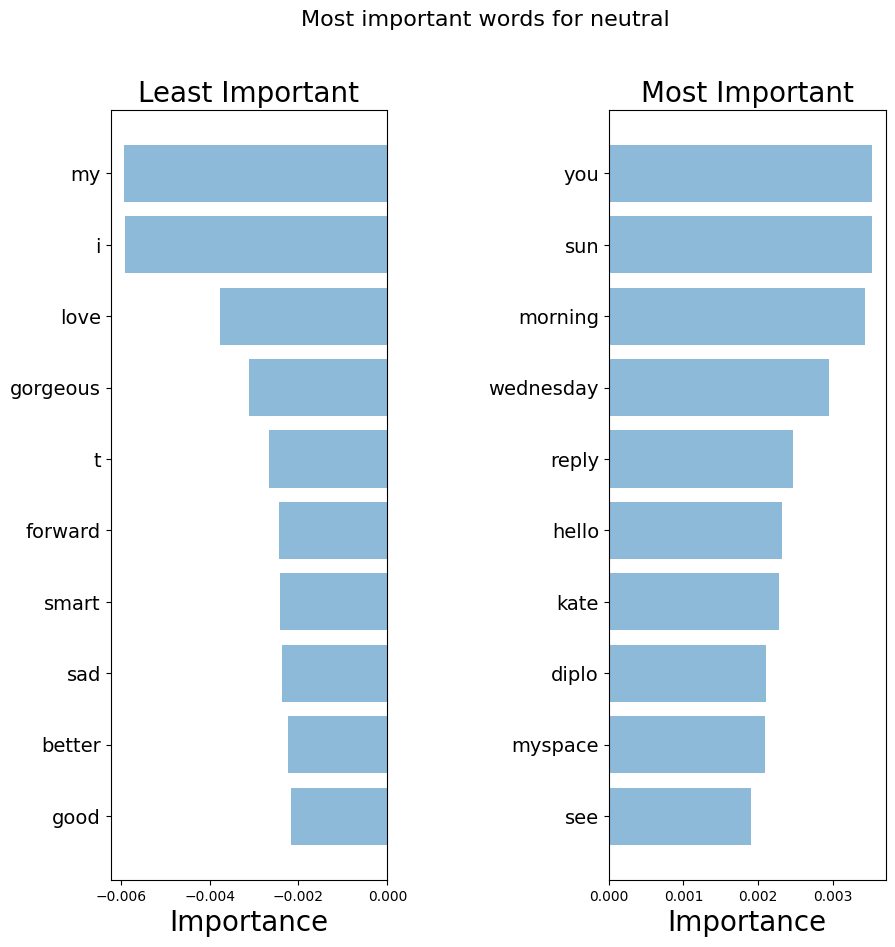

In [ ]:
top_words = sorted_contributions['Neutral']['supporters'][:10].index.tolist()
top_scores = sorted_contributions['Neutral']['supporters'][:10].tolist()
bottom_words = sorted_contributions['Neutral']['detractors'][:10].index.tolist()
bottom_scores = sorted_contributions['Neutral']['detractors'][:10].tolist()

plot_important_words(top_scores, top_words, bottom_scores, bottom_words, "Most important words for neutral")

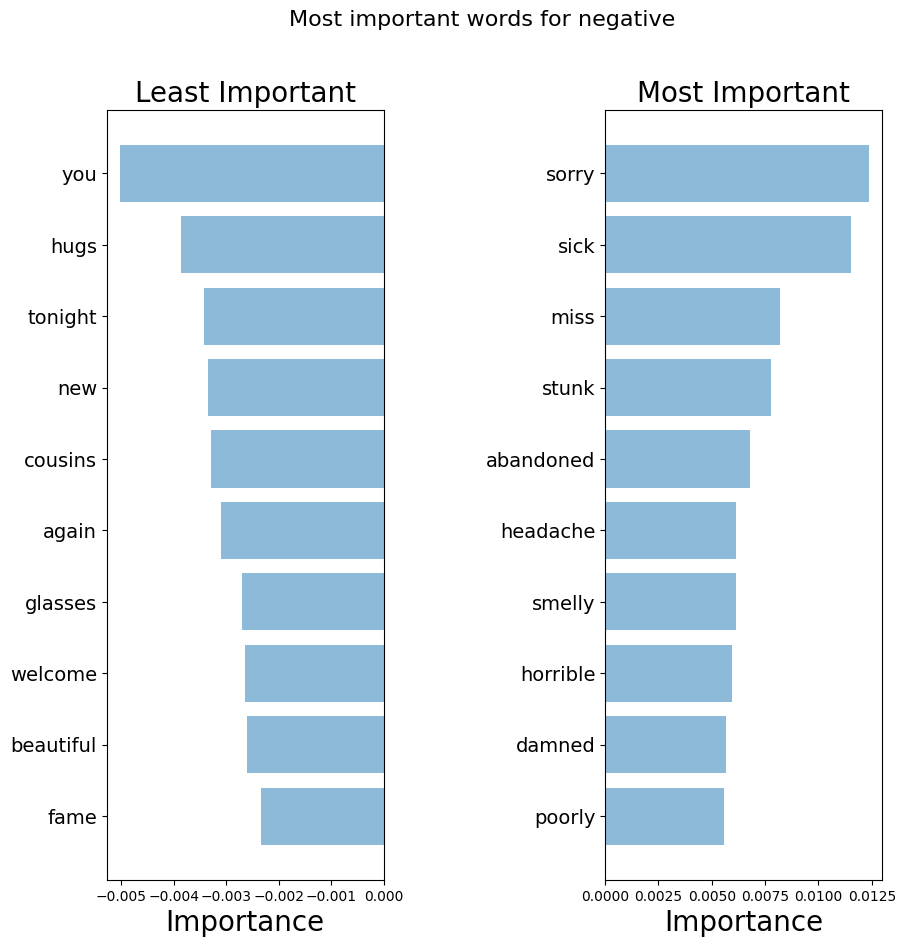

In [ ]:
top_words = sorted_contributions['Negative']['supporters'][:10].index.tolist()
top_scores = sorted_contributions['Negative']['supporters'][:10].tolist()
bottom_words = sorted_contributions['Negative']['detractors'][:10].index.tolist()
bottom_scores = sorted_contributions['Negative']['detractors'][:10].tolist()

plot_important_words(top_scores, top_words, bottom_scores, bottom_words, "Most important words for negative")

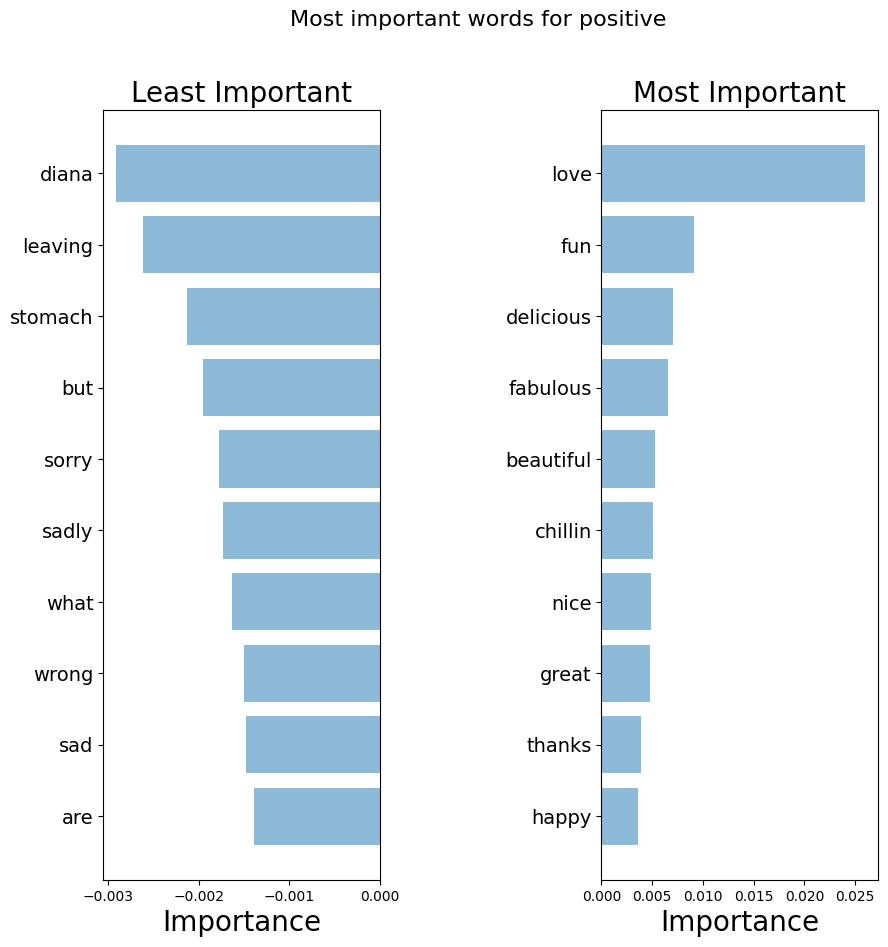

In [ ]:
top_words = sorted_contributions['Positive']['supporters'][:10].index.tolist()
top_scores = sorted_contributions['Positive']['supporters'][:10].tolist()
bottom_words = sorted_contributions['Positive']['detractors'][:10].index.tolist()
bottom_scores = sorted_contributions['Positive']['detractors'][:10].tolist()

plot_important_words(top_scores, top_words, bottom_scores, bottom_words, "Most important words for positive")

Похоже на то, что модель выбирает высоко релевантные слова и соответственно принимает понятные решения. По сравнению со всеми предыдущими моделями, она выбирает наиболее релевантные слова, поэтому лучше будет отправить в продакшн именно ее.

# Шаг 8. Использование синтаксиса при применении end-to-end подходов

Мы рассмотрели быстрые и эффективные подходы для генерации компактных векторных представлений предложений. Однако, опуская порядок слов, мы отбрасываем всю синтаксическую информацию из наших предложений. Если эти методы не дают достаточных результатов, вы можете использовать более сложную модель, которая принимает целые выражения в качестве ввода и предсказывает метки, без необходимости построения промежуточного представления. Распространенный для этого способ состоит в рассмотрении предложения как последовательности индивидуальных векторов слов с использованием или Word2Vec, или более свежих подходов вроде GloVe или CoVe. Именно этим мы и займемся далее.

### CNN для NLP

Сверточные нейронные сети для классификации предложений (CNNs for Sentence Classification) обучаются очень быстро и могут сослужить отличную службу в качестве входного уровня в архитектуре глубокого обучения. Несмотря на то, что сверточные нейронные сети (CNN) в основном известны своей высокой производительностью на данных-изображениях, они показывают превосходные результаты при работе с текстовыми данными, и обычно гораздо быстрее обучаются, чем большинство сложных подходов NLP (например, LSTM-сети и архитектуры Encoder/Decoder ). Эта модель сохраняет порядок слов и обучается ценной информации о том, какие последовательности слов служат предсказанием наших целевых классов. В отличии от предыдущих моделей, она в курсе существования разницы между фразами «Лёша ест растения» и «Растения едят Лёшу».

First, let's embed our text!

In [ ]:
from tensorflow.keras.preprocessing.text  import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

EMBEDDING_DIM = 300
MAX_SEQUENCE_LENGTH = 35
VOCAB_SIZE = len(VOCAB)

VALIDATION_SPLIT=.2
tokenizer = Tokenizer(num_words=VOCAB_SIZE)
tokenizer.fit_on_texts(clean_tweets["text"].tolist())
sequences = tokenizer.texts_to_sequences(clean_tweets["text"].tolist())

word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

cnn_data = pad_sequences(sequences, maxlen=MAX_SEQUENCE_LENGTH)
labels = to_categorical(np.asarray(clean_tweets["label"]))

indices = np.arange(cnn_data.shape[0])
np.random.shuffle(indices)
cnn_data = cnn_data[indices]
labels = labels[indices]
num_validation_samples = int(VALIDATION_SPLIT * cnn_data.shape[0])

embedding_weights = np.zeros((len(word_index)+1, EMBEDDING_DIM))
for word,index in word_index.items():
    embedding_weights[index,:] = word2vec[word] if word in word2vec else np.random.rand(EMBEDDING_DIM)
print(embedding_weights.shape)

Found 26597 unique tokens.
(26598, 300)


Собираем простейшую CNN

In [ ]:
from keras.layers import Dense, Input, Flatten, Dropout, Concatenate
from keras.layers import Conv1D, MaxPooling1D, Embedding
from keras.layers import LSTM, Bidirectional
from keras.models import Model

def ConvNet(embeddings, max_sequence_length, num_words, embedding_dim, labels_index, trainable=False, extra_conv=True):

    embedding_layer = Embedding(num_words,
                            embedding_dim,
                            weights=[embeddings],
                            input_length=max_sequence_length,
                            trainable=trainable)

    sequence_input = Input(shape=(max_sequence_length,), dtype='int32')
    embedded_sequences = embedding_layer(sequence_input)

    # Yoon Kim model (https://arxiv.org/abs/1408.5882)
    convs = []
    filter_sizes = [3,4,5]

    for filter_size in filter_sizes:
        l_conv = Conv1D(filters=128, kernel_size=filter_size, activation='relu')(embedded_sequences)
        l_pool = MaxPooling1D(pool_size=3)(l_conv)
        convs.append(l_pool)

    l_merge = Concatenate(axis=1)(convs)

    # add a 1D convnet with global maxpooling, instead of Yoon Kim model
    conv = Conv1D(filters=128, kernel_size=3, activation='relu')(embedded_sequences)
    pool = MaxPooling1D(pool_size=3)(conv)

    if extra_conv==True:
        x = Dropout(0.5)(l_merge)
    else:
        # Original Yoon Kim model
        x = Dropout(0.5)(pool)
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    #x = Dropout(0.5)(x)

    preds = Dense(labels_index, activation='softmax')(x)

    model = Model(sequence_input, preds)
    model.compile(loss='categorical_crossentropy',
                  optimizer='adam',
                  metrics=['acc'])

    return model

Now let's train our Neural Network

In [ ]:
x_train = cnn_data[:-num_validation_samples]
y_train = labels[:-num_validation_samples]
x_val = cnn_data[-num_validation_samples:]
y_val = labels[-num_validation_samples:]

model = ConvNet(embedding_weights, MAX_SEQUENCE_LENGTH, len(word_index)+1, EMBEDDING_DIM,
                len(list(clean_tweets["label"].unique())), False)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [ ]:
model.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=3, batch_size=128)

Epoch 1/3
172/172 ━━━━━━━━━━━━━━━━━━━━ 57s 317ms/step - acc: 0.4135 - loss: 1.0819 - val_acc: 0.6348 - val_loss: 0.7928
Epoch 2/3
172/172 ━━━━━━━━━━━━━━━━━━━━ 68s 238ms/step - acc: 0.6734 - loss: 0.7471 - val_acc: 0.7047 - val_loss: 0.6929
Epoch 3/3
172/172 ━━━━━━━━━━━━━━━━━━━━ 41s 238ms/step - acc: 0.7277 - loss: 0.6481 - val_acc: 0.7120 - val_loss: 0.6738


In [ ]:
y_pred = model.predict(x_val)

172/172 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step


In [ ]:
y_pred_cnn = np.argmax(y_pred, axis=1)
y_val_cnn = np.argmax(y_val, axis=1)

In [ ]:
y_val_cnn

array([2, 0, 1, ..., 1, 1, 0])

In [ ]:
accuracy_cnn, precision_cnn, recall_cnn, f1_cnn, r2_cnn = get_metrics(y_val_cnn, y_pred_cnn)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f, r2 = %.3f" % (accuracy_cnn, precision_cnn, recall_cnn, f1_cnn, r2_cnn))

accuracy = 0.712, precision = 0.716, recall = 0.712, f1 = 0.713, r2 = 0.081


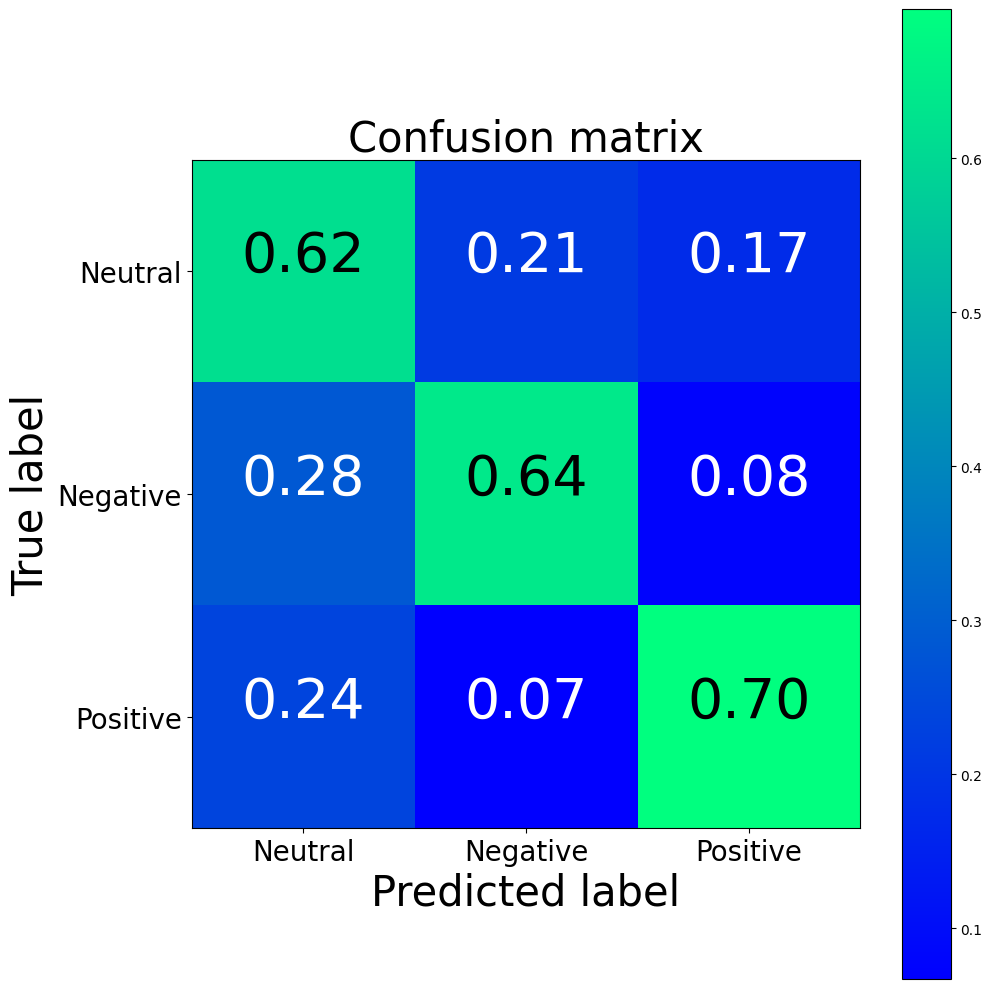

CNN confusion matrix
[[1602  369  253]
 [ 415 1091   65]
 [ 407   74 1220]]
Word2Vec confusion matrix
[[1405  476  357]
 [ 397 1044  117]
 [ 376  116 1208]]
TFIDF confusion matrix
[[1390  473  375]
 [ 437 1012  109]
 [ 384  102 1214]]
BoW confusion matrix
[[1379  470  389]
 [ 442  999  117]
 [ 401  114 1185]]


In [ ]:
cm_cnn = confusion_matrix(y_val_cnn, y_pred_cnn)
fig = plt.figure(figsize=(10, 10))
plot = plot_confusion_matrix(cm, classes=['Neutral','Negative','Positive'], normalize=True, title='Confusion matrix')
plt.show()

print("CNN confusion matrix")
print(cm_cnn)
print("Word2Vec confusion matrix")
print(cm_w2v)
print("TFIDF confusion matrix")
print(cm2)
print("BoW confusion matrix")
print(cm)

Это явно лучшее, что у нас получилось!

Задание на практику.

Скачать датасет https://www.kaggle.com/datasets/yasserh/twitter-tweets-sentiment-dataset



Определить тональность текста (sentiment)

Ссылки для чтения:

https://arxiv.org/pdf/1301.3781.pdf

https://proceedings.neurips.cc/paper_files/paper/2013/file/9aa42b31882ec039965f3c4923ce901b-Paper.pdf

https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/text/word2vec.ipynb

https://habr.com/ru/companies/oleg-bunin/articles/352614/

https://habr.com/ru/articles/446530/

https://habr.com/ru/companies/Voximplant/articles/446738/

https://arxiv.org/abs/1408.5882